<a href="https://colab.research.google.com/github/hoseinm444/FanapExercises/blob/main/Ex12.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Ex12

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from google.colab.patches import cv2_imshow

In [2]:
def show_img_plt(img, fig_height=8, fig_width=6, vmin=0, vmax=255):
    plt.figure(figsize=(fig_height, fig_width), dpi=100)
    plt.imshow(img,cmap='gray', vmin=vmin, vmax=vmax)

In [3]:
def show_mult_img_plt(rows, columns, img_names, vmin=0, vmax=255):
    fig = plt.figure(figsize=(15, 17), dpi=100)
    for i in range(len(img_names)):
        fig.add_subplot(rows, columns, i+1)
        plt.imshow(img_names[i],cmap='gray', vmin=vmin, vmax=vmax)
        plt.axis('off')
        plt.title('img_' + str(i))

##01

 Split the 8th frame of the video (lane.mp4) and Denoise that, then find the edges, and
finally show the edges on the original frame!
(denoising and edge detection method are desired!)

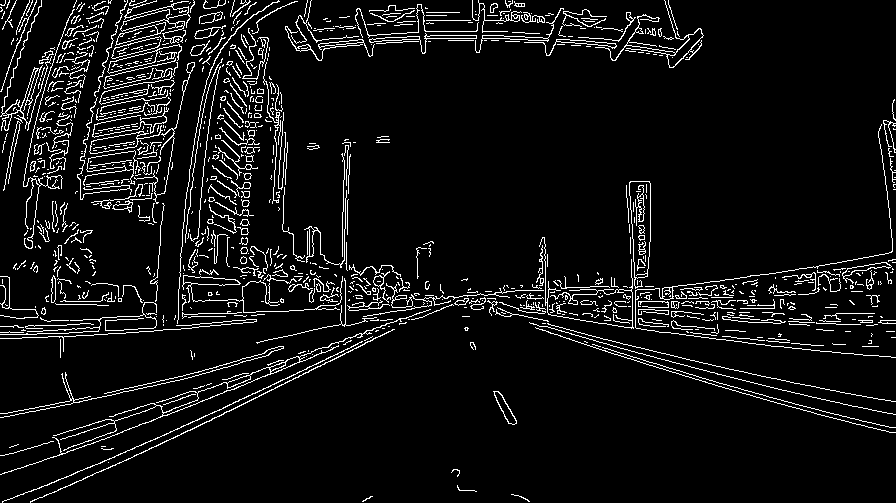

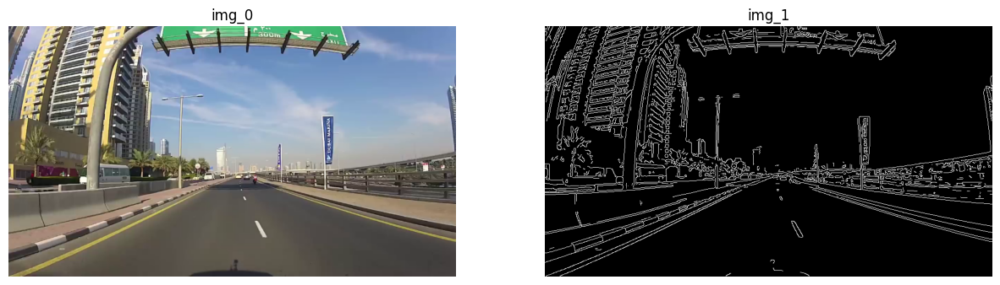

In [13]:
cap = cv2.VideoCapture('lane.mp4')
ret, frame = cap.read()
count = 0
while ret :
    img1 = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    img1_resized = cv2.resize(img1, (int(img1.shape[1]*0.7), int(img1.shape[0]*0.7)))
    count += 1
    if count == 8:
        cap.release()
        break
                                                                              #canny edege detection
img_gaussian_blur = cv2.GaussianBlur(img1_resized, (5, 5), 0)
canny = cv2.Canny(img_gaussian_blur, 100, 120)
show_mult_img_plt(1,2,(img1_resized,canny))
cv2_imshow(canny)

##02

By yourself, Take a color photo of an object and then place that object in another
environment. Then resize and turn it around and retake a picture of it.
Now extract and match the keypoints of these two photos twice. Once when the image is in
color and once when the image is Gray level. Which one works better? Why?

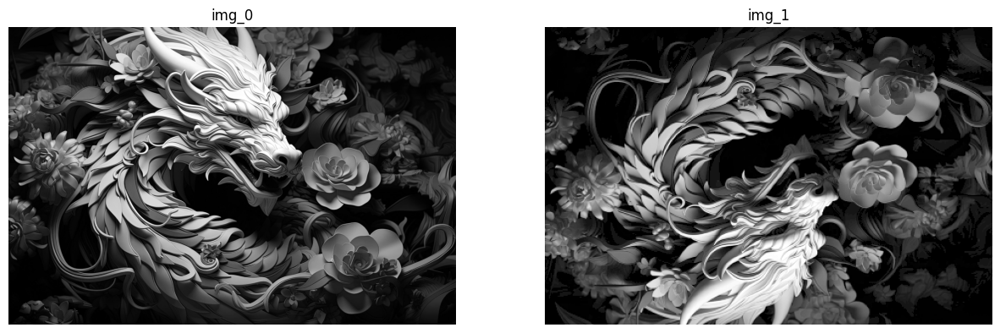

In [5]:
img1 = cv2.imread('11.jpg', 0)
img2 = cv2.imread('44.png', 0)
show_mult_img_plt(1,2,(img1,img2))
img1_resized = cv2.resize(img1, (int(img1.shape[1]*0.5), int(img1.shape[0]*0.5)))
img2_resized = cv2.resize(img2, (int(img2.shape[1]*1), int(img2.shape[0]*1)))

In [6]:
#SIFT
sift = cv2.SIFT_create()
keypoint1, descriptor1 = sift.detectAndCompute(img1_resized, mask=None)
keypoint2, descriptor2 = sift.detectAndCompute(img2_resized, mask=None)

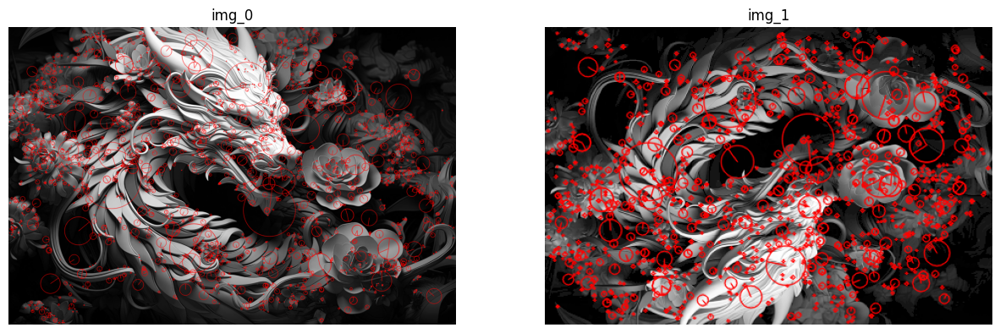

In [7]:
img1_resized_kp = cv2.drawKeypoints(img1_resized, keypoint1, 0, (255, 0, 0), flags= cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_resized_kp = cv2.drawKeypoints(img2_resized, keypoint2, 0, (255, 0, 0), flags= cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
show_mult_img_plt(1,2,(img1_resized_kp,img2_resized_kp))

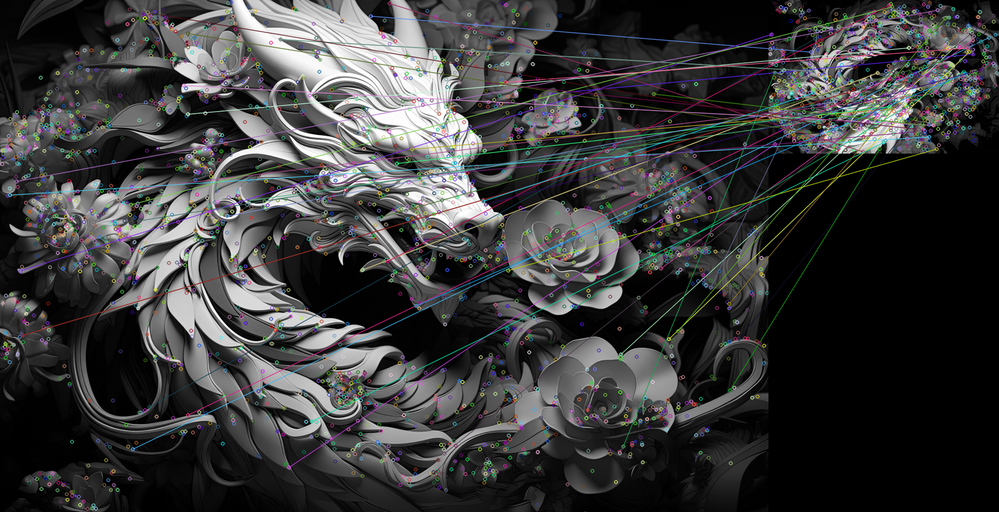

In [8]:
#Brute force
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
matches = bf.match(descriptor1, descriptor2)
matches = sorted(matches, key=lambda x:x.distance)
result1 = cv2.drawMatches(img1_resized, keypoint1, img2_resized, keypoint2, matches[:50], None)
cv2_imshow(result1)

###رنگی

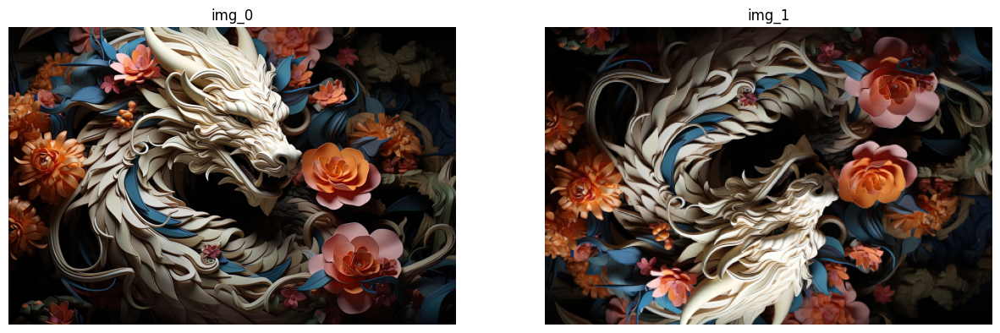

In [9]:
img_bgr1 = cv2.imread('11.jpg',cv2.IMREAD_COLOR)
img_bgr2 = cv2.imread('44.png',cv2.IMREAD_COLOR)
rgb_img1 = cv2.cvtColor(img_bgr1, cv2.COLOR_BGR2RGB)
rgb_img2 = cv2.cvtColor(img_bgr2, cv2.COLOR_BGR2RGB)
show_mult_img_plt(1,2,(rgb_img1,rgb_img2))


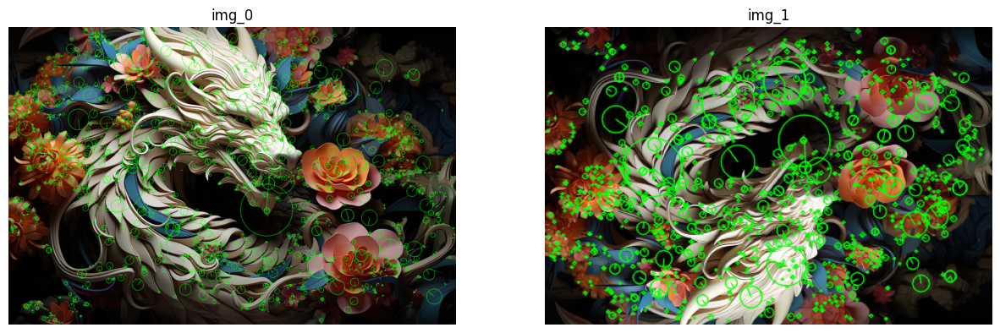

In [10]:
img1_resized_colored = cv2.resize(rgb_img1, (int(img1.shape[1]*0.5), int(img1.shape[0]*0.5)))
img2_resized_colored = cv2.resize(rgb_img2, (int(img2.shape[1]*1), int(img2.shape[0]*1)))
#SIFT
sift = cv2.SIFT_create()
keypoint1_colored, descriptor1_colored = sift.detectAndCompute(img1_resized_colored, mask=None)
keypoint2_colored, descriptor2_colored = sift.detectAndCompute(img2_resized_colored, mask=None)
img1_resized_kp_colored = cv2.drawKeypoints(img1_resized_colored, keypoint1_colored, 0, (0, 255, 0), flags= cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_resized_kp_colored = cv2.drawKeypoints(img2_resized_colored, keypoint2_colored, 0, (0, 255, 0), flags= cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
show_mult_img_plt(1,2,(img1_resized_kp_colored,img2_resized_kp_colored))

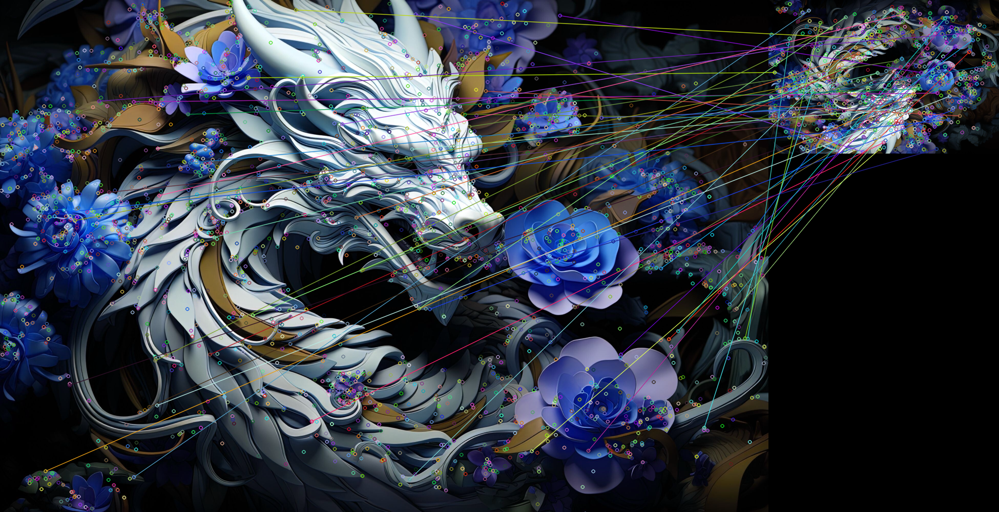

In [11]:
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
matches_colored = bf.match(descriptor1_colored, descriptor2_colored)
matches_colored = sorted(matches_colored, key=lambda x:x.distance)
result2 = cv2.drawMatches(img1_resized_colored, keypoint1_colored, img2_resized_colored, keypoint2_colored, matches_colored[:50], None)
cv2_imshow(result2)

در تصویر رنگی کی پوینت ها بهتر معین می شوند
پس تصویر رنگی بهتر است

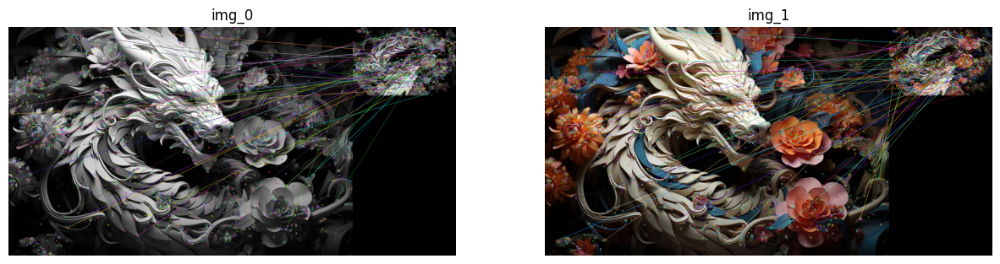

In [12]:
show_mult_img_plt(1,2,(result1,result2))